In [1]:
import diff_gaussian_rasterization as dgr
from diff_gaussian_rasterization import GaussianRasterizationSettings, GaussianRasterizer
import torch
import os
import numpy as np
import matplotlib.pyplot as plt
import math
from tqdm import tqdm
import bayes3d as b
import jax.numpy as jnp
from random import randint
import jax
from jax.scipy.spatial.transform import Rotation as R
import bayes3d.utils.gaussian_splatting as bgs
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device
import bayes3d.utils.gaussian_splatting as bgs
key = jax.random.PRNGKey(0)


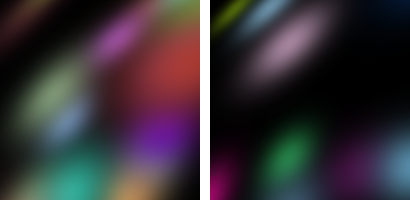

In [8]:
intrinsics = b.Intrinsics(
    height=200,
    width=200,
    fx=300.0, fy=300.0,
    cx=100.0, cy=100.0,
    near=0.01, far=2.5
)
key = jax.random.split(key, 1)[0]
means3D = jax.random.uniform(key, (10,3), minval=-0.5, maxval=0.5) + jnp.array([0.0, 0.0, 1.0])
N = len(means3D)
opacity = jnp.ones((N,1))
key = jax.random.split(key, 1)[0]
colors_precomp = jax.random.uniform(key, (N,5))
scales = -8.0 * jnp.ones((N,3))
rotations = -10.0 * jnp.ones((N,4))
camera_pose = jnp.eye(4)
color_gt = bgs.gaussian_raster(means3D,
                            colors_precomp, jax.nn.sigmoid(opacity), jnp.exp(scales), rotations, camera_pose, intrinsics)
# gradients = bgs.gaussian_raster_bwd(saved_tensors, color_gt)
gt_viz = b.get_rgb_image(jnp.transpose(color_gt, (1,2,0))[...,:3] * 255.0)

key = jax.random.split(key, 1)[0]
means3D = jax.random.uniform(key, (20,3), minval=-0.5, maxval=0.5) + jnp.array([0.0, 0.0, 1.0])
N = len(means3D)
opacity = jnp.ones((N,1))
key = jax.random.split(key, 1)[0]
colors_precomp = jax.random.uniform(key, (N,5))
scales = -8.0 * jnp.ones((N,3))
rotations = -10.0 * jnp.ones((N,4))
camera_pose = jnp.eye(4)
color = bgs.gaussian_raster(means3D,
                            colors_precomp, jax.nn.sigmoid(opacity), jnp.exp(scales), rotations, camera_pose, intrinsics)
b.hstack_images([
    b.get_rgb_image(jnp.transpose(color, (1,2,0))[...,:3] * 255.0),
    gt_viz
])

loss: 0.00839324202388525:   0%|          | 0/100 [00:00<?, ?it/s]  

loss: 0.004855898208916187: 100%|██████████| 100/100 [00:02<00:00, 45.16it/s]


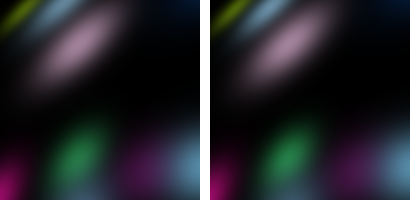

In [12]:
import jax.example_libraries.optimizers as optimizers
# optimizer = torch.optim.Adam([
#     {'params': [colors_precomp], 'lr': 0.01, "name": "pos"},
#     {'params': [means3D], 'lr': 0.001, "name": "pos"},
# ], lr=0.0, eps=1e-15)
def loss(means3D, colors_precomp, opacity, scales, rotations, camera_pose, intrinsics, color_gt):
    color = bgs.gaussian_raster(means3D,
                            colors_precomp, jax.nn.sigmoid(opacity), jnp.exp(scales), rotations, camera_pose, intrinsics)
    return jnp.mean(jnp.abs(color - color_gt))
grad_func = jax.value_and_grad(loss, argnums=(0,1,))
loss, (means_grad, colors_precomp_grad) = grad_func(means3D, colors_precomp, opacity, scales, rotations, camera_pose, intrinsics, color_gt)


opt_init, opt_update, get_params = optimizers.adam(0.01, eps=1e-15)
opt_init2, opt_update2, get_params2 = optimizers.adam(0.001,eps=1e-15)
opt_state = opt_init(colors_precomp)
opt_state2 = opt_init2(means3D)

pbar = tqdm(range(100))
for i in pbar:
    colors_precomp = get_params(opt_state)
    means3D = get_params2(opt_state2)
    loss, (means_grad, colors_precomp_grad) = grad_func(means3D, colors_precomp, opacity, scales, rotations, camera_pose, intrinsics, color_gt)
    opt_state = opt_update(i, colors_precomp_grad, opt_state)
    opt_state2 = opt_update2(i, means_grad, opt_state2)
    pbar.set_description(f"loss: {loss}")

color = bgs.gaussian_raster(means3D,
                            colors_precomp, jax.nn.sigmoid(opacity), jnp.exp(scales), rotations, camera_pose, intrinsics)
b.hstack_images([
    b.get_rgb_image(jnp.transpose(color, (1,2,0))[...,:3] * 255.0),
    gt_viz
])

In [13]:
r3d_path = "/home/nishadgothoskar/bayes3d/scripts/2023-09-05--16-08-21.r3d.zip"
colors, depths, poses, intrinsics, intrinsics_depth = b.utils.load_r3d(r3d_path);

In [15]:
T = 0
color_gt = jnp.transpose(b.utils.resize(colors[T],intrinsics.height, intrinsics.width)[...,:3],(2,0,1)) / 255.0
gt_viz = b.get_rgb_image(jnp.transpose(color_gt, (1,2,0))[...,:3] * 255.0)
cloud = b.apply_transform(b.unproject_depth_jit(depths[T], intrinsics_depth), jnp.eye(4)).reshape(-1,3)
means3D = cloud
N = cloud.shape[0]
opacity = jnp.ones((N,1))
colors_precomp = jax.random.uniform(key, (N,5))
scales = -8.0 * jnp.ones((N,3))
rotations = -10.0 * jnp.ones((N,4))
camera_pose = jnp.eye(4)
N = means3D.shape[0]

color = bgs.gaussian_raster(
    means3D,
    colors_precomp, jax.nn.sigmoid(opacity), jnp.exp(scales), rotations, camera_pose, intrinsics
)
b.hstack_images([
    b.get_rgb_image(jnp.transpose(color, (1,2,0))[...,:3] * 255.0),
    gt_viz
])

OutOfMemoryError: CUDA out of memory. Tried to allocate 2.86 GiB. GPU 0 has a total capacty of 21.99 GiB of which 1.30 GiB is free. Including non-PyTorch memory, this process has 20.68 GiB memory in use. Of the allocated memory 49.75 MiB is allocated by PyTorch, and 2.86 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF

tensor([[0.4265, 0.5812, 0.2605],
        [0.3066, 0.7651, 0.3131],
        [0.9492, 0.6029, 0.9600],
        [0.2430, 0.1785, 0.0413],
        [0.5642, 0.1701, 0.1726],
        [0.1148, 0.4242, 0.6737],
        [0.3661, 0.7268, 0.1594],
        [0.8524, 0.1522, 0.5639],
        [0.5122, 0.7856, 0.5391],
        [0.9547, 0.0675, 0.9999]], device='cuda:0')


/var/tmp/ipykernel_1139840/3198322282.py:9: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  means3D = torch.tensor(torch.rand((10,3))-0.5 + torch.tensor([0.0, 0.0, 1.0]), requires_grad=True, device=device)
/var/tmp/ipykernel_1139840/3198322282.py:12: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  opacity = torch.tensor(torch.ones((N,1)), requires_grad=True, device=device)
/var/tmp/ipykernel_1139840/3198322282.py:13: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  colors_precomp_gt = torch.tensor(torch.rand((N,3)), requires_grad=True, device=de

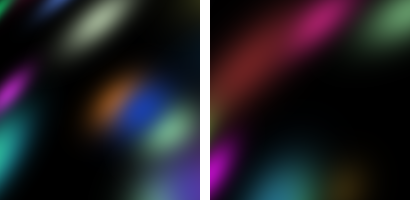

In [95]:
intrinsics = b.Intrinsics(
    height=200,
    width=200,
    fx=300.0, fy=300.0,
    cx=100.0, cy=100.0,
    near=0.01, far=2.5
)
rasterizer = bgs.intrinsics_to_rasterizer(intrinsics, jnp.eye(4))
means3D = torch.tensor(torch.rand((10,3))-0.5 + torch.tensor([0.0, 0.0, 1.0]), requires_grad=True, device=device)
means2D = torch.zeros_like(means3D, dtype=means3D.dtype, requires_grad=True, device="cuda") + 0
N = means3D.shape[0]
opacity = torch.tensor(torch.ones((N,1)), requires_grad=True, device=device)
colors_precomp_gt = torch.tensor(torch.rand((N,3)), requires_grad=True, device=device).detach()
scales = torch.tensor(-8.0 * torch.ones((N,3)), requires_grad=True, device=device)
rotations = torch.tensor(-10.0 * torch.ones((N,4)), requires_grad=True, device=device)

color,radii = rasterizer(
    means3D = means3D,
    means2D = means2D,
    shs = None,
    colors_precomp = colors_precomp_gt,
    opacities = torch.sigmoid(opacity),
    scales = torch.exp(scales),
    rotations = rotations
)
print(colors_precomp_gt)
color_gt = color.detach()
gt_viz = b.get_rgb_image(torch.permute(color, (1,2,0)).cpu().detach().numpy() * 255.0)
gt_viz

means3D = torch.tensor(torch.rand((20,3))-0.5 + torch.tensor([0.0, 0.0, 1.0]), requires_grad=True, device=device)
means2D = torch.zeros_like(means3D, dtype=means3D.dtype, requires_grad=True, device="cuda") + 0
N = means3D.shape[0]
opacity = torch.tensor(torch.ones((N,1)), requires_grad=True, device=device)
colors_precomp = torch.tensor(torch.rand((N,3)), requires_grad=True, device=device)
scales = torch.tensor(-8.0 * torch.ones((N,3)), requires_grad=True, device=device)
rotations = torch.tensor(-10.0 * torch.ones((N,4)), requires_grad=True, device=device)
color,_ = rasterizer(
    means3D = means3D,
    means2D = means2D,
    shs = None,
    colors_precomp = colors_precomp,
    opacities = torch.sigmoid(opacity),
    scales = torch.exp(scales),
    rotations = rotations
)

b.hstack_images([
    b.get_rgb_image(torch.permute(color, (1,2,0)).cpu().detach().numpy() * 255.0),
    gt_viz
])

0.0042832642793655396: 100%|██████████| 100/100 [00:00<00:00, 366.27it/s]


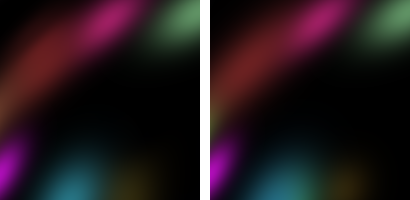

In [99]:
optimizer = torch.optim.Adam([
    {'params': [colors_precomp], 'lr': 0.01, "name": "pos"},
    {'params': [means3D], 'lr': 0.001, "name": "pos"},
], lr=0.0, eps=1e-15)

pbar = tqdm(range(100))
for _ in pbar:
    color,_ = rasterizer(
        means3D = means3D,
        means2D = means2D,
        shs = None,
        colors_precomp = colors_precomp,
        opacities = torch.sigmoid(opacity),
        scales = torch.exp(scales),
        rotations = rotations
    )
    optimizer.zero_grad()
    loss = torch.abs((color_gt - color)[:3,...]).mean()
    loss.backward()
    optimizer.step()
    pbar.set_description(f"{loss.item()}")
b.hstack_images([
    b.get_rgb_image(torch.permute(color, (1,2,0)).cpu().detach().numpy()[...,:3] * 255.0),
    gt_viz
])

/var/tmp/ipykernel_760351/1658275295.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  opacity = torch.tensor(torch.ones((N,1)), requires_grad=True, device=device)
/var/tmp/ipykernel_760351/1658275295.py:17: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  colors_precomp = torch.tensor(torch.rand((N,3)), requires_grad=True, device=device)
/var/tmp/ipykernel_760351/1658275295.py:18: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  scales = torch.tensor(-15.0 * torch.ones((N,1)), requires_grad=True, device=device)
/var/tmp/ipykernel_760351/165

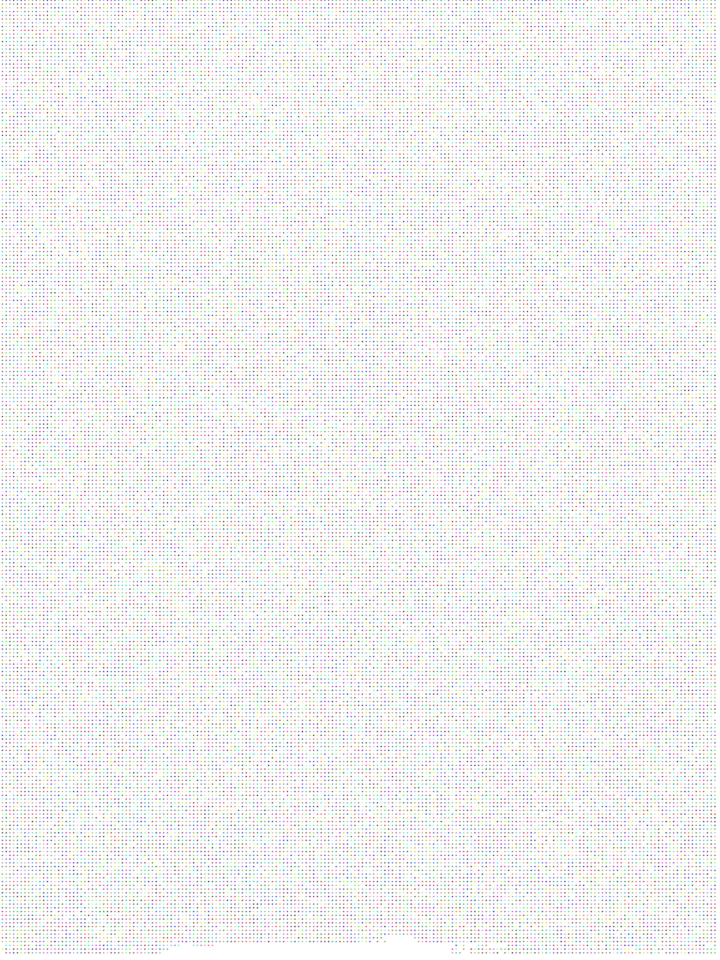

In [47]:
T = 0
rasterizer = intrinsics_to_rasterizer(intrinsics, poses[T])
color_gt = (torch.tensor(np.array(b.utils.resize(colors[T],intrinsics.height, intrinsics.width))[...,:3]).permute(2,0,1) / 255.0).cuda()
gt_viz = b.get_rgb_image(torch.permute(color_gt, (1,2,0)).cpu().detach().numpy() * 255.0)
gt_viz

# means3D a= torch.tensor(torch.rand((1000,3))-0.5 + torch.tensor([0.0, 0.0, 1.0]), requires_grad=True, device=device)
cloud = np.array(b.apply_transform(b.unproject_depth_jit(depths[T], intrinsics_depth), poses[T]).reshape(-1,3))
# cloud = cloud[cloud[:,2] < 1.0,:]
# choice = jax.random.choice(jax.random.PRNGKey(1000), cloud.shape[0], shape=(12000,), replace=False)
# cloud = cloud[choice]
means3D = torch.tensor(cloud, requires_grad=True, device=device)

means2D = torch.zeros_like(means3D, dtype=means3D.dtype, requires_grad=True, device="cuda") + 0
N = means3D.shape[0]
opacity = torch.tensor(torch.ones((N,1)), requires_grad=True, device=device)
colors_precomp = torch.tensor(torch.rand((N,3)), requires_grad=True, device=device)
scales = torch.tensor(-15.0 * torch.ones((N,1)), requires_grad=True, device=device)
rotations = torch.tensor(-10.0 * torch.ones((N,4)), requires_grad=True, device=device)

color,_ = rasterizer(
    means3D = means3D,
    means2D = means2D,
    shs = None,
    colors_precomp = colors_precomp,
    opacities = torch.sigmoid(opacity),
    scales = torch.exp(scales).repeat((1,3)),
    rotations = rotations
)
b.hstack_images([
    b.get_rgb_image(torch.permute(color, (1,2,0)).cpu().detach().numpy() * 255.0),
])

0.17163124680519104: 100%|██████████| 1/1 [00:00<00:00, 157.05it/s]

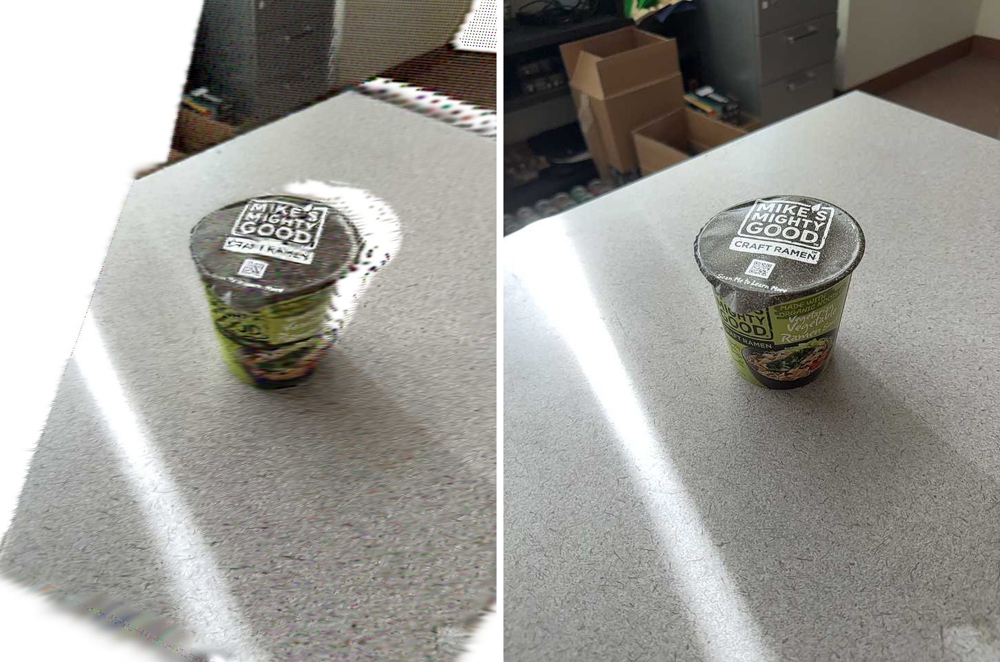

In [49]:
T = 50
rasterizer = intrinsics_to_rasterizer(intrinsics, poses[T])
color_gt = (torch.tensor(np.array(b.utils.resize(colors[T],intrinsics.height, intrinsics.width))[...,:3]).permute(2,0,1) / 255.0).cuda()
gt_viz = b.get_rgb_image(torch.permute(color_gt, (1,2,0)).cpu().detach().numpy() * 255.0)
gt_viz

optimizer = torch.optim.Adam([
    {'params': [colors_precomp], 'lr': 0.01, "name": "pos"},
    # {'params': [means3D], 'lr': 0.05, "name": "pos"},
    {'params': [scales], 'lr': 0.001, "name": "pos"},
    {'params': [rotations], 'lr': 1.0, "name": "pos"},
    # {'params': [opacity], 'lr': 0.05, "name": "pos"},
], lr=0.0, eps=1e-15)

pbar = tqdm(range(1))
for _ in pbar:
    color,_ = rasterizer(
        means3D = means3D,
        means2D = means2D,
        shs = None,
        colors_precomp = colors_precomp,
        opacities = torch.sigmoid(opacity),
        scales = torch.exp(scales).repeat((1,3)),
        rotations = rotations
    )
    optimizer.zero_grad()
    loss = torch.abs(color_gt - color).mean()
    loss.backward()
    optimizer.step()
    pbar.set_description(f"{loss.item()}")
b.hstack_images([
    b.get_rgb_image(torch.permute(color, (1,2,0)).cpu().detach().numpy() * 255.0),
    gt_viz
])

In [ ]:
optimizer = torch.optim.Adam([
    {'params': [colors_precomp], 'lr': 0.01, "name": "pos"},
    # {'params': [means3D], 'lr': 0.05, "name": "pos"},
    {'params': [scales], 'lr': 0.001, "name": "pos"},
    {'params': [rotations], 'lr': 1.0, "name": "pos"},
    # {'params': [opacity], 'lr': 0.05, "name": "pos"},
], lr=0.0, eps=1e-15)

pbar = tqdm(range(100))
for _ in pbar:
    color,_ = rasterizer(
        means3D = means3D,
        means2D = means2D,
        shs = None,
        colors_precomp = colors_precomp,
        opacities = torch.sigmoid(opacity),
        scales = torch.exp(scales).repeat((1,3)),
        rotations = rotations
    )
    optimizer.zero_grad()
    loss = torch.abs(color_gt - color).mean()
    loss.backward()
    optimizer.step()
    pbar.set_description(f"{loss.item()}")
b.hstack_images([
    b.get_rgb_image(torch.permute(color, (1,2,0)).cpu().detach().numpy() * 255.0),
    gt_viz
])

In [9]:
from bayes3d.viz.open3dviz import Open3DVisualizer
visualizer = Open3DVisualizer(intrinsics)

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.
[Open3D INFO] EGL headless mode enabled.
FEngine (64 bits) created at 0x564f3dd5c690 (threading is enabled)
EGL(1.5)
OpenGL(4.1)


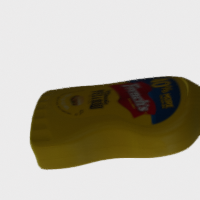

In [10]:
import os
import open3d as o3d
model_dir = os.path.join(b.utils.get_assets_dir(), "ycb_video_models/models")
i = 4
mesh_path = os.path.join(model_dir, b.utils.ycb_loader.MODEL_NAMES[i], "textured.obj")
mesh  = o3d.io.read_triangle_model(mesh_path)
visualizer.render.scene.clear_geometry()
pose = b.distributions.gaussian_vmf(jax.random.PRNGKey(1000),b.transform_from_pos(jnp.array([0.0, 0.0, 0.3])), 0.01, 1.0)
mesh.meshes[0].mesh.transform(pose)
visualizer.render.scene.add_model(f"m", mesh)
mesh.meshes[0].mesh.transform(jnp.linalg.inv(pose))
rgbd = visualizer.capture_image(intrinsics, jnp.eye(4))
b.get_rgb_image(rgbd.rgb)

/var/tmp/ipykernel_430444/312588735.py:14: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  opacity = torch.tensor(torch.ones((N,1)), requires_grad=True, device=device)
/var/tmp/ipykernel_430444/312588735.py:15: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  colors_precomp = torch.tensor(torch.rand((N,3)), requires_grad=True, device=device)
/var/tmp/ipykernel_430444/312588735.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  scales = torch.tensor(-12.0 * torch.ones((N,3)), requires_grad=True, device=device)
/var/tmp/ipykernel_430444/312588

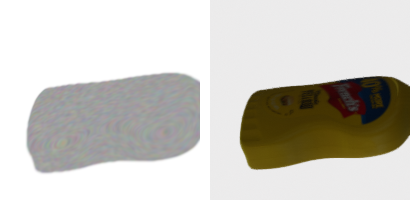

In [11]:
color_gt = (torch.tensor(np.array(rgbd.rgb)[...,:3]).permute(2,0,1) / 255.0).cuda()
gt_viz = b.get_rgb_image(torch.permute(color_gt, (1,2,0)).cpu().detach().numpy() * 255.0)
gt_viz

# means3D = torch.tensor(torch.rand((1000,3))-0.5 + torch.tensor([0.0, 0.0, 1.0]), requires_grad=True, device=device)
cloud = np.array(b.unproject_depth_jit(rgbd.depth, rgbd.intrinsics).reshape(-1,3))
cloud = cloud[cloud[:,2] < intrinsics.far,:]
# choice = jax.random.choice(jax.random.PRNGKey(1000), cloud.shape[0], shape=(100,), replace=False)
# cloud = cloud[choice]
means3D = torch.tensor(cloud, requires_grad=True, device=device)

means2D = torch.zeros_like(means3D, dtype=means3D.dtype, requires_grad=True, device="cuda") + 0
N = means3D.shape[0]
opacity = torch.tensor(torch.ones((N,1)), requires_grad=True, device=device)
colors_precomp = torch.tensor(torch.rand((N,3)), requires_grad=True, device=device)
scales = torch.tensor(-12.0 * torch.ones((N,3)), requires_grad=True, device=device)
rotations = torch.tensor(-10.0 * torch.ones((N,4)), requires_grad=True, device=device)

color,_ = rasterizer(
    means3D = means3D,
    means2D = means2D,
    shs = None,
    colors_precomp = torch.sigmoid(colors_precomp),
    opacities = torch.sigmoid(opacity),
    scales = torch.exp(scales),
    rotations = rotations
)
b.hstack_images([
    b.get_rgb_image(torch.permute(color, (1,2,0)).cpu().detach().numpy() * 255.0),
    gt_viz
])

0.05333171412348747: 100%|██████████| 100/100 [00:00<00:00, 342.25it/s]


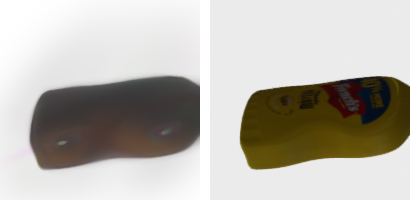

In [12]:
optimizer = torch.optim.Adam([
    {'params': [colors_precomp], 'lr': 0.01, "name": "pos"},
    # {'params': [means3D], 'lr': 0.05, "name": "pos"},
    {'params': [scales], 'lr': 0.01, "name": "pos"},
    {'params': [rotations], 'lr': 0.1, "name": "pos"},
], lr=0.0, eps=1e-15)

pbar = tqdm(range(100))
for _ in pbar:
    color,_ = rasterizer(
        means3D = means3D,
        means2D = means2D,
        shs = None,
        colors_precomp = torch.sigmoid(colors_precomp),
        opacities = torch.sigmoid(opacity),
        scales = torch.exp(scales),
        rotations = rotations
    )
    optimizer.zero_grad()
    loss = torch.abs(color_gt - color).mean()
    loss.backward()
    optimizer.step()
    pbar.set_description(f"{loss.item()}")
b.hstack_images([
    b.get_rgb_image(torch.permute(color, (1,2,0)).cpu().detach().numpy() * 255.0),
    gt_viz
])

In [13]:
b.show_cloud("obs", 
    means3D.cpu().detach().numpy(),
    color=jnp.transpose(torch.sigmoid(colors_precomp).cpu().detach().numpy()),
    size=0.001)
    # color=jnp.transpose(color.reshape(-1,3))/255.0, 

    # size=0.003)

/var/tmp/ipykernel_462502/1223238796.py:15: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  opacity = torch.tensor(torch.ones((N,1)), requires_grad=True, device=device)
/var/tmp/ipykernel_462502/1223238796.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  colors_precomp = torch.tensor(torch.rand((N,3)), requires_grad=True, device=device)
/var/tmp/ipykernel_462502/1223238796.py:17: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  scales = torch.tensor(-15.0 * torch.ones((N,3)), requires_grad=True, device=device)
/var/tmp/ipykernel_462502/122

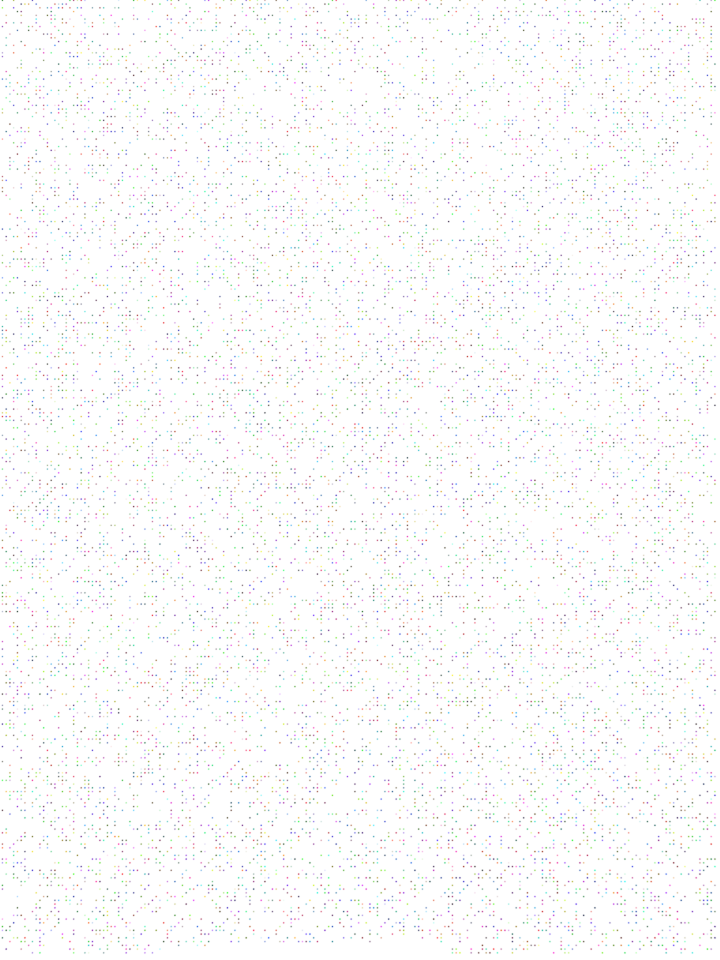

0.036051440984010696: 100%|██████████| 100/100 [00:00<00:00, 167.38it/s]


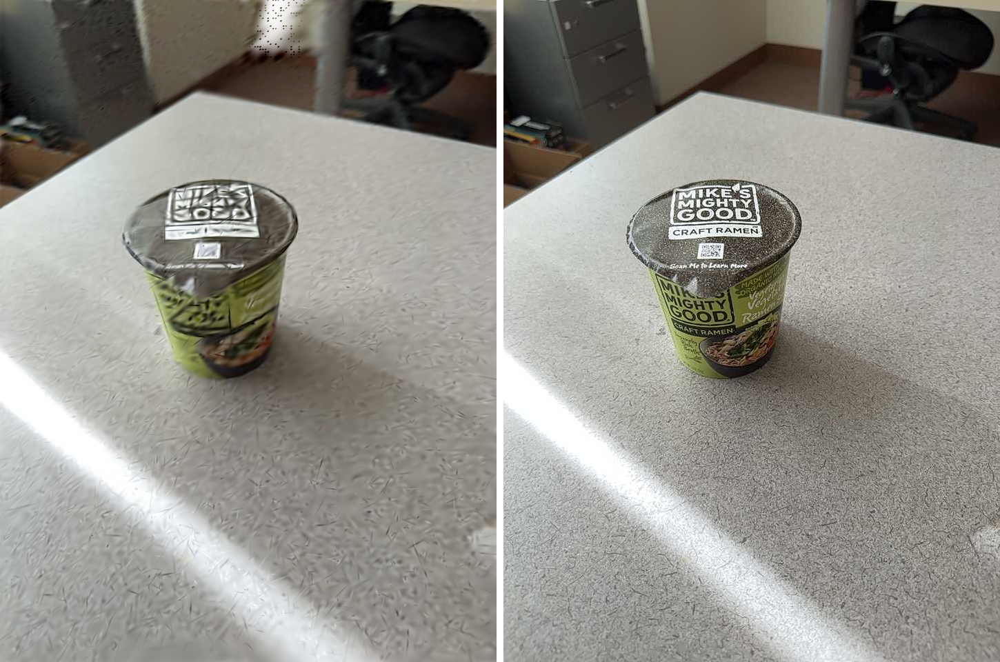

In [21]:
b.clear()
b.show_cloud("obs", 
    means3D.cpu().detach().numpy() * 0.3,
    color=jnp.transpose(torch.sigmoid(colors_precomp).cpu().detach().numpy()),
    size=0.002)
    # color=jnp.transpose(color.reshape(-1,3))/255.0, 

    # size=0.003)

0.08097682893276215:   0%|          | 0/100 [00:00<?, ?it/s]

0.0761624351143837: 100%|██████████| 100/100 [00:00<00:00, 137.03it/s]


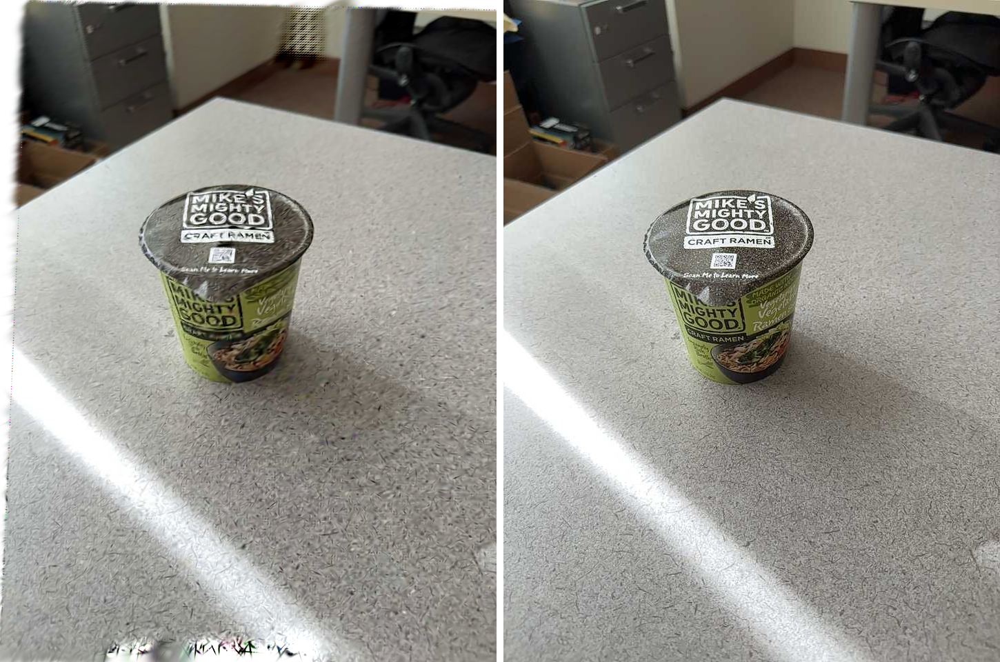

In [37]:
color_gt = (torch.tensor(np.array(b.utils.resize(colors[20],intrinsics.height, intrinsics.width))[...,:3]).permute(2,0,1) / 255.0).cuda()
gt_viz = b.get_rgb_image(torch.permute(color_gt, (1,2,0)).cpu().detach().numpy() * 255.0)


pos = torch.tensor([0.0, 0.0, 0.0], device=device, requires_grad=True)
quat = torch.tensor([1.0, 0.0, 0.0, 0.0], device=device, requires_grad=True)


optimizer = torch.optim.Adam([
    # {'params': [colors_precomp], 'lr': 0.01, "name": "pos"},
    {'params': [pos], 'lr': 0.001, "name": "pos"},
    {'params': [quat], 'lr': 0.01, "name": "pos"},
    # {'params': [scales], 'lr': 0.001, "name": "pos"},
    # {'params': [rotations], 'lr': 1.0, "name": "pos"},
    # {'params': [opacity], 'lr': 0.05, "name": "pos"},
], lr=0.0, eps=1e-15)


pbar = tqdm(range(100))
for _ in pbar:
    pose = pytorch3d.transforms.Transform3d(
        matrix=torch.vstack([torch.hstack([pytorch3d.transforms.quaternion_to_matrix(quat), pos.reshape(3,1)]), torch.tensor([0.0, 0.0, 0.0, 1.0], device=device)])
    )
    pose.transform_points(means3D)
    color,_ = rasterizer(
        means3D = pose.transform_points(means3D),
        means2D = means2D,
        shs = None,
        colors_precomp = colors_precomp,
        opacities = torch.sigmoid(opacity),
        scales = torch.exp(scales),
        rotations = rotations
    )
    optimizer.zero_grad()
    loss = torch.abs(color_gt - color).mean()
    loss.backward()
    optimizer.step()
    pbar.set_description(f"{loss.item()}")
b.hstack_images([
    b.get_rgb_image(torch.permute(color, (1,2,0)).cpu().detach().numpy() * 255.0),
    gt_viz
])

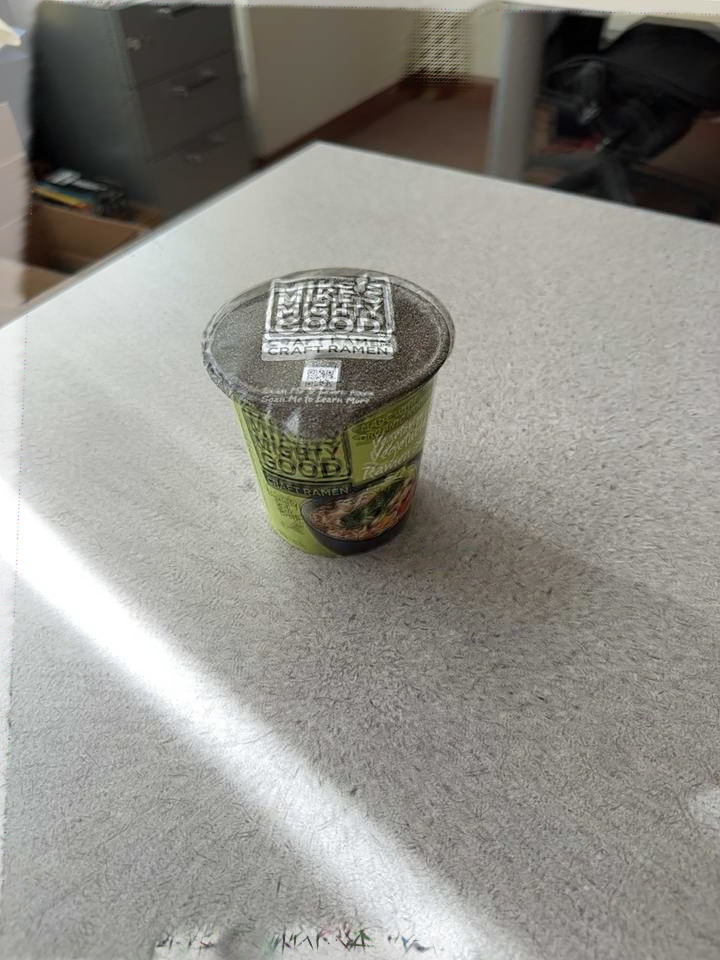

In [50]:
b.overlay_image(
    b.get_rgb_image(torch.permute(color, (1,2,0)).cpu().detach().numpy() * 255.0),
    gt_viz
)

In [28]:
b.clear()
b.show_pose("1", poses[0])
b.show_pose("2", poses[20])
b.show_pose("3", pose.get_matrix().cpu().detach().numpy())

In [25]:
pose.get_matrix()

tensor([[[ 0.9990,  0.0361, -0.0248, -0.0458],
         [-0.0364,  0.9993, -0.0106, -0.0027],
         [ 0.0244,  0.0115,  0.9996,  0.0225],
         [ 0.0000,  0.0000,  0.0000,  1.0000]]], device='cuda:0',
       grad_fn=<CloneBackward0>)

In [86]:
b.clear()
b.show_cloud("obs", 
    means3D.cpu().detach().numpy() * 0.3,
    color=jnp.transpose(torch.sigmoid(colors_precomp).cpu().detach().numpy()),
    size=0.002)
    # color=jnp.transpose(color.reshape(-1,3))/255.0, 

    # size=0.003)